# Q1

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

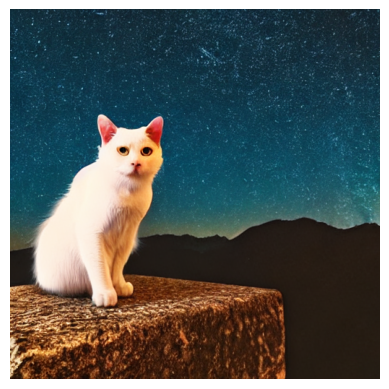

In [ ]:
from diffusers import StableDiffusionPipeline
import torch
import matplotlib.pyplot as plt
from PIL import Image

# Load the Stable Diffusion pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
).to("cuda")

# Generate image from prompt
prompt = "A cat sitting on a mountain under the stars"
image = pipe(prompt).images[0]

# Save the result
image.save("cat_mountain_stars.png")

# Display the image using matplotlib
plt.imshow(image)
plt.axis('off')  # Hide axes for cleaner display
plt.show()

# Q2- code snippet 1

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Saved: futuristic_city_van_gogh.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: futuristic_city_pixar.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: futuristic_city_cyberpunk.png


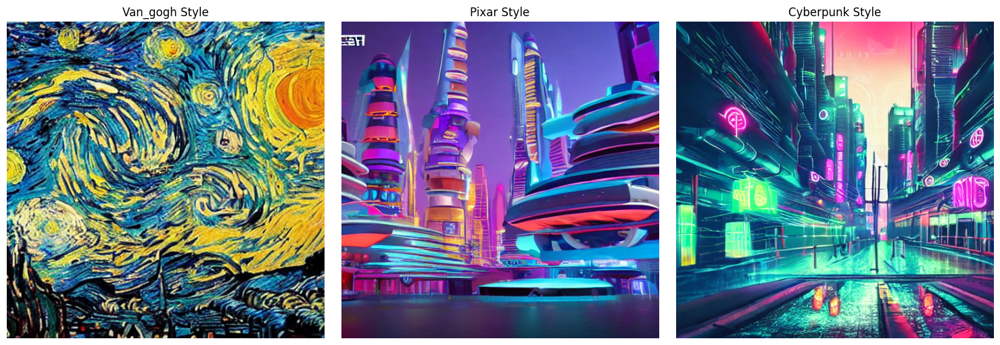

In [ ]:
from diffusers import StableDiffusionPipeline
import torch
import matplotlib.pyplot as plt
from PIL import Image

# Load the Stable Diffusion pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
).to("cuda")

# Define styled prompts
prompts = {
    "van_gogh": "A futuristic city in the style of a Van Gogh painting, vibrant brush strokes, starry sky",
    "pixar": "A futuristic city in Pixar 3D animation style, colorful and stylized, cinematic lighting",
    "cyberpunk": "A futuristic city in cyberpunk style, neon lights, rain, dark atmosphere, high tech"
}

# Generate, save, and display styled images
plt.figure(figsize=(15, 5))  # Set figure size for side-by-side display
for i, (style, styled_prompt) in enumerate(prompts.items(), 1):
    # Generate image
    image = pipe(styled_prompt).images[0]

    # Save image
    image.save(f"futuristic_city_{style}.png")
    print(f"Saved: futuristic_city_{style}.png")

    # Display image
    plt.subplot(1, 3, i)
    plt.imshow(image)
    plt.title(f"{style.capitalize()} Style")
    plt.axis('off')  # Hide axes for cleaner display

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

# Q2- code snippet 2

## 🛠 Optional Tuning Tips

* `strength` closer to `1.0` → more stylized, but less faithful to original
* `guidance_scale` > `7.5` → more prompt-adherence, stronger style

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Saved: futuristic_city_van_gogh_high_impact.png


  0%|          | 0/45 [00:00<?, ?it/s]

Saved: futuristic_city_pixar_high_impact.png


  0%|          | 0/45 [00:00<?, ?it/s]

Saved: futuristic_city_cyberpunk_high_impact.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: futuristic_city_van_gogh_low_impact.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: futuristic_city_pixar_low_impact.png


  0%|          | 0/25 [00:00<?, ?it/s]

Saved: futuristic_city_cyberpunk_low_impact.png


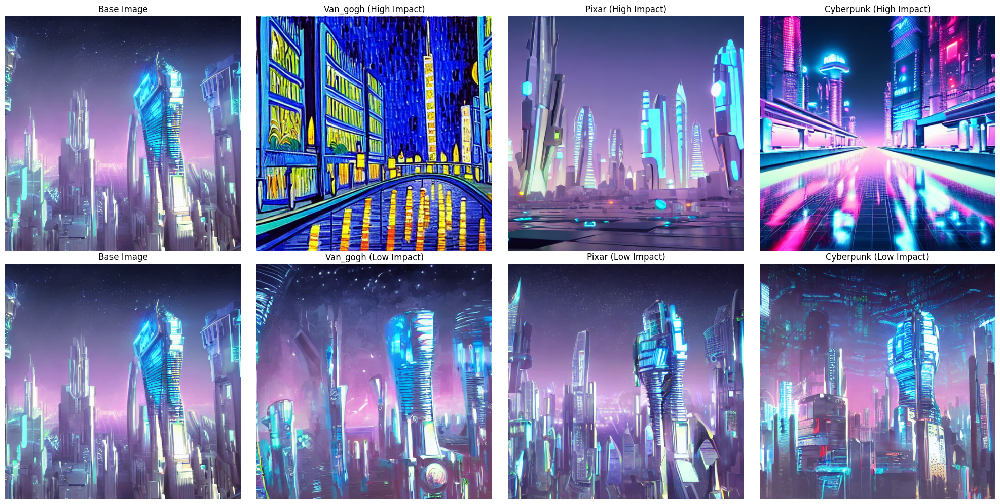

In [ ]:
import torch
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline
from PIL import Image
import matplotlib.pyplot as plt

# Load base text-to-image pipeline
txt2img_pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to("cuda")

# Generate the initial image
base_prompt = "A futuristic city"
base_image = txt2img_pipe(base_prompt).images[0]
base_image = base_image.resize((512, 512))  # Resize for Img2Img compatibility
base_image.save("futuristic_city_base.png")

# Load image-to-image pipeline
img2img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to("cuda")

# Style prompts
style_prompts = {
    "van_gogh": "A futuristic city in the style of Vincent van Gogh, expressive brush strokes",
    "pixar": "A futuristic city in Pixar 3D animation style, cinematic lighting, stylized look",
    "cyberpunk": "A futuristic city in cyberpunk style, neon lights, futuristic, dark atmosphere"
}

# Parameter sets
param_sets = [
    {"name": "High Impact", "strength": 0.9, "guidance_scale": 10.0},
    {"name": "Low Impact", "strength": 0.5, "guidance_scale": 5.0}
]

# Set up figure for displaying images
plt.figure(figsize=(20, 10))  # Set figure size for 2x4 grid

# Display base image in both rows (for reference)
for row in range(2):
    plt.subplot(2, 4, row * 4 + 1)
    plt.imshow(base_image)
    plt.title("Base Image")
    plt.axis('off')

# Apply styles using Img2Img for each parameter set
for row, params in enumerate(param_sets):
    strength = params["strength"]
    guidance_scale = params["guidance_scale"]
    param_name = params["name"]

    for col, (style_name, styled_prompt) in enumerate(style_prompts.items(), 2):
        styled_image = img2img_pipe(
            prompt=styled_prompt,
            image=base_image,
            strength=strength,
            guidance_scale=guidance_scale
        ).images[0]
        styled_image.save(f"futuristic_city_{style_name}_{param_name.lower().replace(' ', '_')}.png")
        print(f"Saved: futuristic_city_{style_name}_{param_name.lower().replace(' ', '_')}.png")

        # Display styled image
        plt.subplot(2, 4, row * 4 + col)
        plt.imshow(styled_image)
        plt.title(f"{style_name.capitalize()} ({param_name})")
        plt.axis('off')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

# Q3- code snippet 1

## 🧠 Understanding Negative Prompts in Stable Diffusion

A **negative prompt** tells the model *what to avoid*. It does **not** "edit" an image after it's generated. Instead, it acts **at generation time**, influencing the **denoising process** to steer away from undesired artifacts.



Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

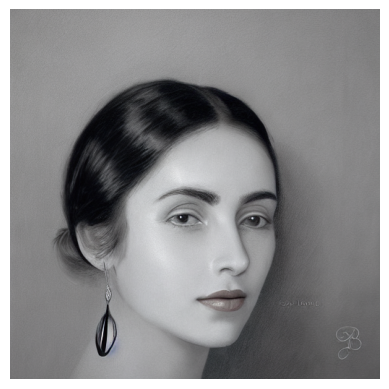

In [3]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt
from PIL import Image

# Load the pre-trained Stable Diffusion model (photorealistic style)
model_id = "runwayml/stable-diffusion-v1-5"  # You can replace with more advanced ones like SDXL if needed

# Load the pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16
).to("cuda")  # Use "cpu" if no GPU

# Define prompts
positive_prompt = "A portrait of a beautiful woman, photorealistic"
negative_prompt = "blurry, distorted face, bad anatomy, extra limbs"

# Generate the image with negative prompt guidance
image = pipe(
    prompt=positive_prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=30,
    guidance_scale=8.0  # Higher = more aligned with the positive prompt
).images[0]

# Save the result
image.save("enhanced_portrait.png")

# Display the image using matplotlib
plt.imshow(image)
plt.axis('off')  # Hide axes for cleaner display
plt.show()

## 🔍 Explanation

* `prompt`: Describes what you want in the image (positive guidance).
* `negative_prompt`: Describes what you want to **avoid** in the image (used to suppress undesired features).
* `guidance_scale`: Controls how strongly the model follows the prompts (6–12 is typical).
* `num_inference_steps`: Controls generation quality/speed (20–50 is typical).


# Q3- code snippet 2

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/18 [00:00<?, ?it/s]

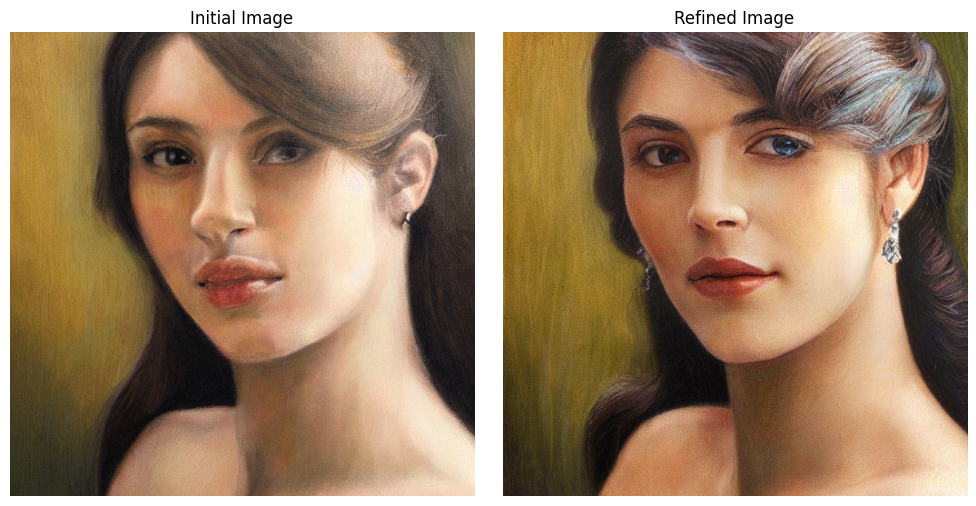

In [4]:
import torch
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline
from PIL import Image
import matplotlib.pyplot as plt

# Step 1: Load base text-to-image pipeline
base_model_id = "runwayml/stable-diffusion-v1-5"
pipe_txt2img = StableDiffusionPipeline.from_pretrained(
    base_model_id,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

# Step 2: Generate initial image from text
prompt = "A portrait of a beautiful woman, photorealistic"
base_image = pipe_txt2img(prompt=prompt, num_inference_steps=30, guidance_scale=8.0).images[0]

# Save initial image
base_image.save("initial_image.png")

# Step 3: Load img2img pipeline
pipe_img2img = StableDiffusionImg2ImgPipeline.from_pretrained(
    base_model_id,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

# Optional: Resize image to match model expected resolution (e.g., 512x512)
base_image = base_image.resize((512, 512))

# Step 4: Enhance using img2img with negative prompt
refined_image = pipe_img2img(
    prompt=prompt,
    negative_prompt="blurry, distorted face, bad anatomy, extra limbs",
    image=base_image,
    strength=0.6,  # How much to modify the image [0.0-1.0]
    guidance_scale=8.5,
    num_inference_steps=30
).images[0]

# Save enhanced image
refined_image.save("refined_image.png")

# Display both images side by side using matplotlib
plt.figure(figsize=(10, 5))  # Set figure size for side-by-side display

# Display initial image
plt.subplot(1, 2, 1)
plt.imshow(base_image)
plt.title("Initial Image")
plt.axis('off')  # Hide axes for cleaner display

# Display refined image
plt.subplot(1, 2, 2)
plt.imshow(refined_image)
plt.title("Refined Image")
plt.axis('off')  # Hide axes for cleaner display

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

## 🔧 Key Parameters in `img2img`

* **`image`**: the input image you want to improve.
* **`strength`**: how much the final image should differ from the input (0.3–0.8 is typical).
* **`negative_prompt`**: used to discourage unwanted features like blur, extra limbs, distortion, etc.
* **`guidance_scale`**: how strongly the model adheres to the prompt.


# Q4

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionImg2ImgPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

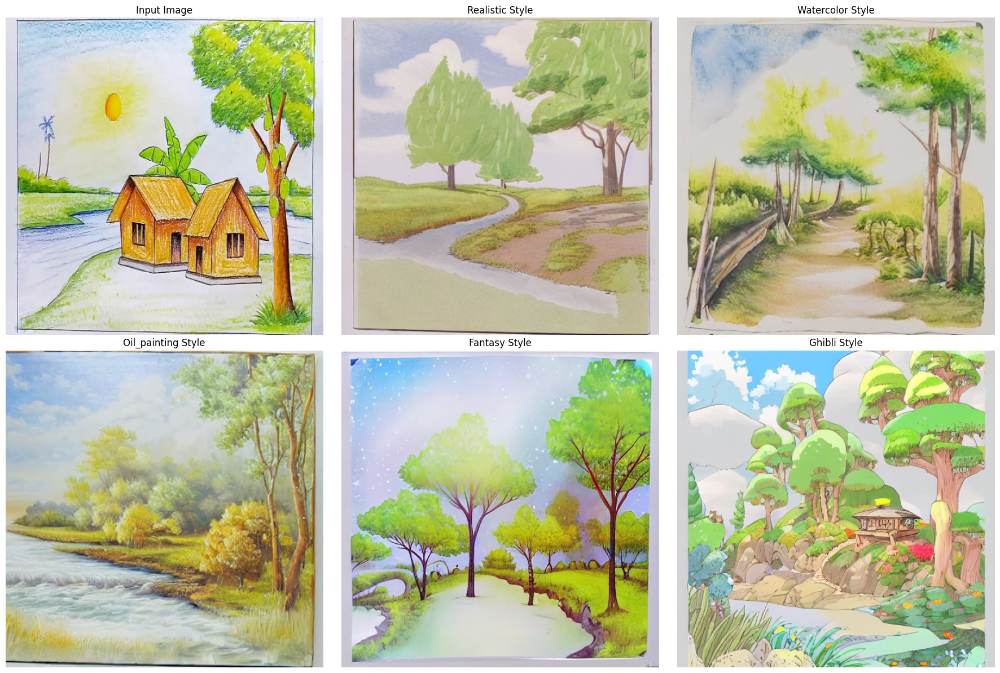

In [7]:
import torch
from diffusers import StableDiffusionImg2ImgPipeline
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt

# Load the image from the URL
# url = "https://i1.delgarm.com/i/804/9910/20/5ff986e541622.jpg"
# image = Image.open(BytesIO(requests.get(url).content)).convert("RGB").resize((512, 512))
image_path = "/content/5ff986e541622.jpg"
image = Image.open(image_path).convert("RGB").resize((512, 512))

# Load Img2Img pipeline
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_auth_token=True  # Or use login with huggingface-cli
).to("cuda")

# Updated style prompts for a nature sketch
style_prompts = {
    "realistic": "A high-resolution photo of a peaceful natural landscape with trees, a path, and soft sunlight",
    "watercolor": "A watercolor painting of a forest trail with trees and natural scenery, delicate brushwork",
    "oil_painting": "An oil painting of a nature scene with rich textures and detailed brush strokes",
    "fantasy": "A fantasy forest landscape with glowing trees, magical atmosphere, mystical lighting",
    "ghibli": "A landscape in the style of Studio Ghibli, colorful and whimsical, detailed nature elements"
}

# Parameters
guidance_scale = 8.0
strength = 0.75

# Generate and save images
results = {}
for style, prompt in style_prompts.items():
    result = pipe(
        prompt=prompt,
        image=image,
        strength=strength,
        guidance_scale=guidance_scale
    ).images[0]
    result.save(f"styled_nature_{style}.png")
    results[style] = result

# Display input image and results
plt.figure(figsize=(18, 12))  # Larger figure for 6 images
# Display input image
plt.subplot(2, 3, 1)
plt.imshow(image)
plt.title("Input Image")
plt.axis("off")
# Display styled images
for i, (style, img) in enumerate(results.items(), 2):
    plt.subplot(2, 3, i)
    plt.imshow(img)
    plt.title(f"{style.capitalize()} Style")
    plt.axis("off")
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()